## Loading a pretrained StyleGAN model

In [1]:
!pip install torch==1.10.0+cu111 torchvision==0.11.1+cu111 -f https://download.pytorch.org/whl/cu111/torch_stable.html
!pip install ninja
!git clone https://github.com/NVlabs/stylegan2-ada-pytorch.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/cu111/torch_stable.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 GB 835.3 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 41.4 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 2.0.0+cu118
    Uninstalling torch-2.0.0+cu118:
      Successfully uninstalled torch-2.0.0+cu118
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.15.1+cu118
    Uninstalling torchvision-0.15.1+cu118:
      Successfully uninstalled torchvision-0.15.1+cu118
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.15.1 requires torch==2.0.0, but you have torch 1.10.0+cu111 which is incompatible.
torchdata 0.6.0 requires torch==2.0.

In [2]:
%cd stylegan2-ada-pytorch

/content/stylegan2-ada-pytorch


In [3]:
import torch
import torchvision
import numpy as np
import PIL.Image
import matplotlib.pyplot as plt
import dnnlib
import legacy
import random

In [4]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [9]:
# Load the pretrained StyleGAN2-ADA model.
url = 'https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl'
with dnnlib.util.open_url(url) as f:
    # G = legacy.load_network_pkl(f)['G_ema'].to(device)
    dict_param = legacy.load_network_pkl(f)
    G = dict_param['G_ema'].to(device)
    D = dict_param['D'].to(device)

In [10]:
import matplotlib.pyplot as plt
def imageview(img, view_res=512):
  rows, cols = 1, img.shape[0]
  upscaled_image_tensor = torch.nn.functional.interpolate(img, scale_factor=view_res/img.shape[-1], mode='nearest', recompute_scale_factor=True)
  # normalize the pixel values of the upscaled tensor to the range [0, 255]
  normalized_image_tensor = (upscaled_image_tensor + 1) / 2 * 255
  normalized_image_tensor = torch.clamp(normalized_image_tensor, 0, 255)
  fig = plt.figure(dpi = view_res)
  plt.subplots_adjust(wspace=0, hspace=0)
  for i in range(0, rows * cols):
      fig.add_subplot(rows, cols, i+1)
      plt.imshow(normalized_image_tensor.permute(0, 2, 3, 1).to(torch.uint8).cpu().numpy()[i])
      # plt.title(title[i])
      plt.axis(False)
  plt.show()

## Printing the architecture

In [11]:
print(G)

Generator(
  (synthesis): SynthesisNetwork(
    (b4): SynthesisBlock(
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b8): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b16): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b32): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConn

In [13]:
# Discriminator architechtire
print(D)

Discriminator(
  (b1024): DiscriminatorBlock(
    (fromrgb): Conv2dLayer()
    (conv0): Conv2dLayer()
    (conv1): Conv2dLayer()
    (skip): Conv2dLayer()
  )
  (b512): DiscriminatorBlock(
    (conv0): Conv2dLayer()
    (conv1): Conv2dLayer()
    (skip): Conv2dLayer()
  )
  (b256): DiscriminatorBlock(
    (conv0): Conv2dLayer()
    (conv1): Conv2dLayer()
    (skip): Conv2dLayer()
  )
  (b128): DiscriminatorBlock(
    (conv0): Conv2dLayer()
    (conv1): Conv2dLayer()
    (skip): Conv2dLayer()
  )
  (b64): DiscriminatorBlock(
    (conv0): Conv2dLayer()
    (conv1): Conv2dLayer()
    (skip): Conv2dLayer()
  )
  (b32): DiscriminatorBlock(
    (conv0): Conv2dLayer()
    (conv1): Conv2dLayer()
    (skip): Conv2dLayer()
  )
  (b16): DiscriminatorBlock(
    (conv0): Conv2dLayer()
    (conv1): Conv2dLayer()
    (skip): Conv2dLayer()
  )
  (b8): DiscriminatorBlock(
    (conv0): Conv2dLayer()
    (conv1): Conv2dLayer()
    (skip): Conv2dLayer()
  )
  (b4): DiscriminatorEpilogue(
    (mbstd): Mini

## Visualizing and printing the weights of 'b1024.conv1' layer

In [14]:
# Print the weights of the chosen layer.
layer = G.synthesis.b1024.conv1
weights1 = layer.weight.detach().cpu().numpy()
print(weights1.shape)
print(weights1)

(32, 32, 3, 3)
[[[[ 0.5074812   1.1998049   0.5371145 ]
   [ 0.44401515  2.6050704  -0.01086236]
   [ 1.2395022  -0.16365209  0.64544326]]

  [[-0.8664978   0.61592245 -1.0916802 ]
   [-0.2837225  -1.4518836  -1.1321101 ]
   [-0.40520248 -0.3041015  -1.3851835 ]]

  [[ 0.08943254  0.05449752 -0.6377199 ]
   [-1.0361853  -0.57320553  1.1334028 ]
   [-0.03746326  0.49329662 -0.63504237]]

  ...

  [[-5.8516703  -5.321      -3.8687007 ]
   [ 2.9666946   7.2765913   6.6982665 ]
   [ 0.85570705  0.5923144  -2.4628377 ]]

  [[-2.8423994   0.1445634   1.5651602 ]
   [-1.7977846  -0.08218203  3.2997265 ]
   [ 0.7205818  -3.764224    0.576578  ]]

  [[ 1.2739891   2.5639803   1.4368845 ]
   [ 3.157414    2.1054194   0.2889292 ]
   [ 2.3960602   3.0810826   2.6172152 ]]]


 [[[ 1.8144187   5.7424726   1.3065542 ]
   [ 3.2394018   3.610818    1.5193334 ]
   [ 1.3801026   2.3972228   0.6164653 ]]

  [[ 0.34462875 -0.2671425  -0.2573491 ]
   [ 0.1939657   0.10641136 -1.8678746 ]
   [-0.7331943  -0.

## visualize output of 'b1024' layer

In [15]:
all_seeds = [96971, 20103]

In [16]:
all_z = np.stack([np.random.RandomState(seed).randn(G.z_dim) for seed in all_seeds])
all_z.shape

(2, 512)

In [17]:
all_w = G.mapping(torch.from_numpy(all_z).to(device), None)
w_avg = G.mapping.w_avg
truncation_psi = 1
all_w = w_avg + (all_w - w_avg) * truncation_psi
all_w.shape

Setting up PyTorch plugin "bias_act_plugin"... Done.


torch.Size([2, 18, 512])

In [18]:
x,img = G.synthesis.b4(None, None, all_w[:,0:2,:].to(device))
x,img = G.synthesis.b8(x, img, all_w[:,1:4,:].to(device))
x,img = G.synthesis.b16(x, img, all_w[:,3:6,:].to(device))
x,img = G.synthesis.b32(x, img, all_w[:,5:8,:].to(device))
x,img = G.synthesis.b64(x, img, all_w[:,7:10,:].to(device))
x,img = G.synthesis.b128(x, img, all_w[:,9:12,:].to(device))
x,img = G.synthesis.b256(x, img, all_w[:,11:14,:].to(device))
x,img = G.synthesis.b512(x, img, all_w[:,13:16,:].to(device))
x,img = G.synthesis.b1024(x, img, all_w[:,15:18,:].to(device))
print(x.shape,img.shape)

Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
torch.Size([2, 32, 1024, 1024]) torch.Size([2, 3, 1024, 1024])


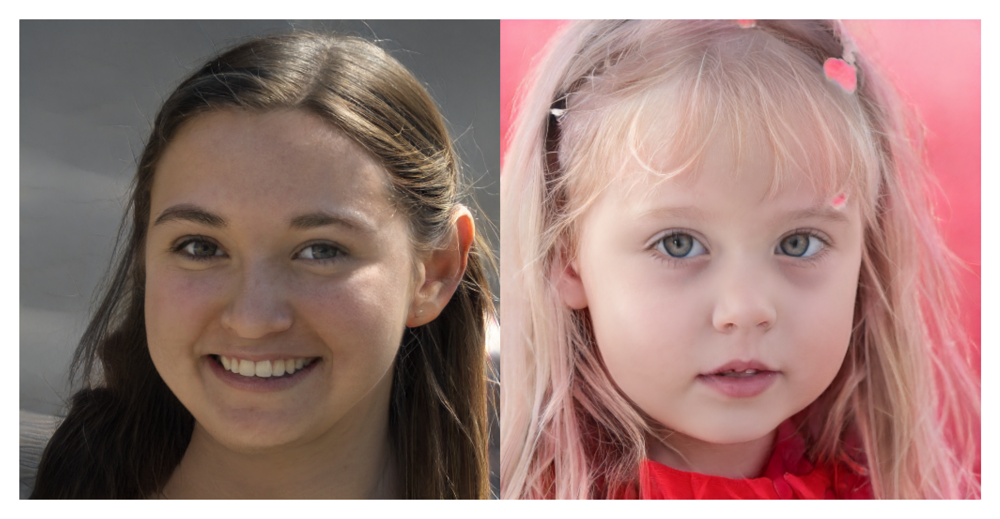

In [19]:
imageview(img, view_res=512)

## Modify the code to perform style mixing between two randomly generated latent vectors at the chosen layer. Display the resulting images.

In [20]:
row_seeds = [910709]
col_seeds = [200308]
all_seeds = list(set(row_seeds + col_seeds))

In [21]:
all_z = np.stack([np.random.RandomState(seed).randn(G.z_dim) for seed in all_seeds])
all_w = G.mapping(torch.from_numpy(all_z).to(device), None)
w_avg = G.mapping.w_avg
truncation_psi = 1
all_w = w_avg + (all_w - w_avg) * truncation_psi
w_dict = {seed: w for seed, w in zip(all_seeds, list(all_w))}
all_w.shape

torch.Size([2, 18, 512])

In [22]:
x,img = G.synthesis.b4(None, None, all_w[:,0:2,:].to(device))
x,img = G.synthesis.b8(x, img, all_w[:,1:4,:].to(device))
x,img = G.synthesis.b16(x, img, all_w[:,3:6,:].to(device))
x,img = G.synthesis.b32(x, img, all_w[:,5:8,:].to(device))
x,img = G.synthesis.b64(x, img, all_w[:,7:10,:].to(device))
x,img = G.synthesis.b128(x, img, all_w[:,9:12,:].to(device))
x,img = G.synthesis.b256(x, img, all_w[:,11:14,:].to(device))
x,img = G.synthesis.b512(x, img, all_w[:,13:16,:].to(device))
x,img = G.synthesis.b1024(x, img, all_w[:,15:18,:].to(device))
print(x.shape,img.shape)

torch.Size([2, 32, 1024, 1024]) torch.Size([2, 3, 1024, 1024])


Generating style-mixed images...


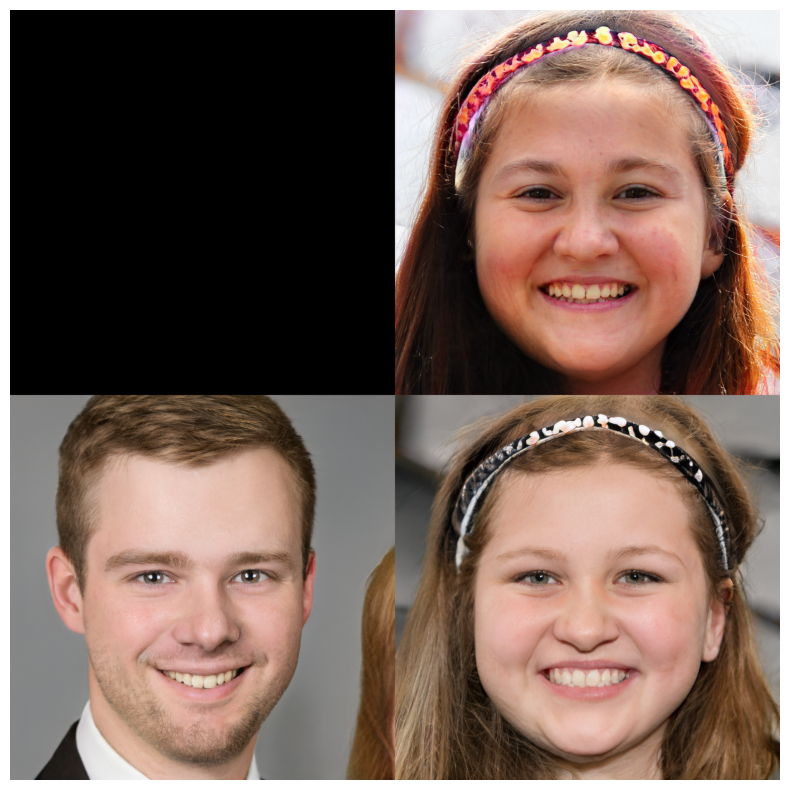

In [23]:
print('Generating style-mixed images...')
all_images = img
all_images = (all_images.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).cpu().numpy()
image_dict = {(seed, seed): image for seed, image in zip(all_seeds, list(all_images))}

for row_seed in row_seeds:
    for col_seed in col_seeds:
        w = w_dict[row_seed].clone()
        col_styles = [0,1,2,3,4,5,6,7]
        w[col_styles] = w_dict[col_seed][col_styles]
        w = w[np.newaxis]
        x,img = G.synthesis.b4(None, None, w[:,0:2,:].to(device))
        x,img = G.synthesis.b8(x, img, w[:,1:4,:].to(device))
        x,img = G.synthesis.b16(x, img, w[:,3:6,:].to(device))
        x,img = G.synthesis.b32(x, img, w[:,5:8,:].to(device))
        x,img = G.synthesis.b64(x, img, w[:,7:10,:].to(device))
        x,img = G.synthesis.b128(x, img, w[:,9:12,:].to(device))
        x,img = G.synthesis.b256(x, img, w[:,11:14,:].to(device))
        x,img = G.synthesis.b512(x, img, w[:,13:16,:].to(device))
        x,img = G.synthesis.b1024(x, img, w[:,15:18,:].to(device))
        image = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
        image_dict[(row_seed, col_seed)] = image[0].cpu().numpy()

W = 1024
H = 1024
canvas = PIL.Image.new('RGB', (W * (len(col_seeds) + 1), H * (len(row_seeds) + 1)), 'black')
for row_idx, row_seed in enumerate([0] + row_seeds):
    for col_idx, col_seed in enumerate([0] + col_seeds):
        if row_idx == 0 and col_idx == 0:
            continue
        key = (row_seed, col_seed)
        if row_idx == 0:
            key = (col_seed, col_seed)
        if col_idx == 0:
            key = (row_seed, row_seed)
        canvas.paste(PIL.Image.fromarray(image_dict[key], 'RGB'), (W * col_idx, H * row_idx))
canvas.save(f'grid.png')

import matplotlib.pyplot as plt
import numpy as np

# Load an example image (replace with your own image path)
image = plt.imread('grid.png')

# Create a new figure and plot the image
fig, ax = plt.subplots(figsize=(10,10))  # Set the figure size to fill the plot with the image
ax.imshow(image)
ax.axis('off')  # Remove the x and y axis labels

# Show the plot
plt.show()


# Choose another layer of interest and visualize its weights. Explain any differences or similarities with the weights of the previous layer.  How does the depth of the chosen layer affect the quality of the generated images in style mixing?

#### Visualizing and printing the weights of 'b512.conv1' layer

In [24]:
# Print the weights of the chosen layer.
layer = G.synthesis.b512.conv1
weights1 = layer.weight.detach().cpu().numpy()
print(weights1.shape)
print(weights1)

(64, 64, 3, 3)
[[[[ 1.16834259e+00  6.47364929e-02 -1.62330151e+00]
   [ 5.47506034e-01 -3.50682735e+00 -1.92343891e+00]
   [ 3.15828562e-01 -3.07402873e+00  6.48242056e-01]]

  [[-2.09949493e+00  1.39875984e+00  1.61090040e+00]
   [-1.06046192e-01  1.39851928e+00  2.94626999e+00]
   [-7.51548290e-01 -1.10379672e+00 -6.13248467e-01]]

  [[-4.80560303e+00 -8.48222256e-01 -5.03653705e-01]
   [ 2.38746107e-01 -1.05673420e+00  2.71434450e+00]
   [-1.04808331e+00 -1.20017910e+00  1.75444543e+00]]

  ...

  [[-3.93345261e+00  3.53876877e+00  2.18530822e+00]
   [-1.13385546e+00  3.25190616e+00 -4.62118673e+00]
   [ 1.96990979e+00  3.03214453e-02 -3.36917973e+00]]

  [[-1.58699667e+00 -5.58880234e+00 -2.27791047e+00]
   [-1.29765093e+00 -5.22763538e+00 -2.19553757e+00]
   [ 5.92867911e-01 -3.19906510e-02  1.30932403e+00]]

  [[-1.95191789e+00 -1.78003991e+00  9.96419907e-01]
   [-2.32871962e+00 -3.63059139e+00 -4.32929397e-01]
   [ 7.09231138e-01 -3.33016396e-01  1.66221261e+00]]]


 [[[-2.525

torch.Size([5, 64, 512, 512]) torch.Size([5, 3, 512, 512])


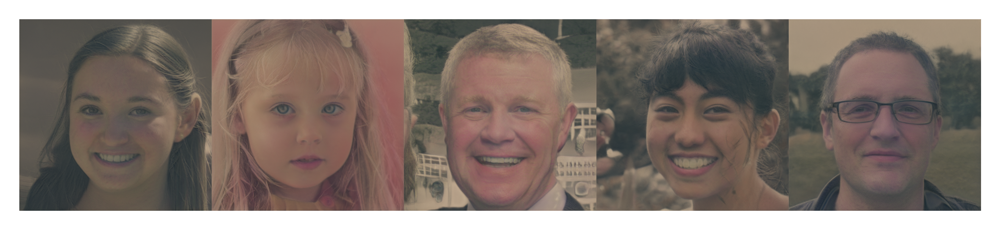

In [25]:
all_seeds = [96971, 20103, 91687, 22, 55]
all_z = np.stack([np.random.RandomState(seed).randn(G.z_dim) for seed in all_seeds])
all_w = G.mapping(torch.from_numpy(all_z).to(device), None)
w_avg = G.mapping.w_avg
truncation_psi = 1
all_w = w_avg + (all_w - w_avg) * truncation_psi
x,img = G.synthesis.b4(None, None, all_w[:,0:2,:].to(device))
x,img = G.synthesis.b8(x, img, all_w[:,1:4,:].to(device))
x,img = G.synthesis.b16(x, img, all_w[:,3:6,:].to(device))
x,img = G.synthesis.b32(x, img, all_w[:,5:8,:].to(device))
x,img = G.synthesis.b64(x, img, all_w[:,7:10,:].to(device))
x,img = G.synthesis.b128(x, img, all_w[:,9:12,:].to(device))
x,img = G.synthesis.b256(x, img, all_w[:,11:14,:].to(device))
x,img = G.synthesis.b512(x, img, all_w[:,13:16,:].to(device))
# x,img = G.synthesis.b1024(x, img, all_w[:,15:18,:].to(device))
print(x.shape,img.shape)

imageview(img, view_res=512)

#### Style mixing at differrent depth

Generating style-mixed images...


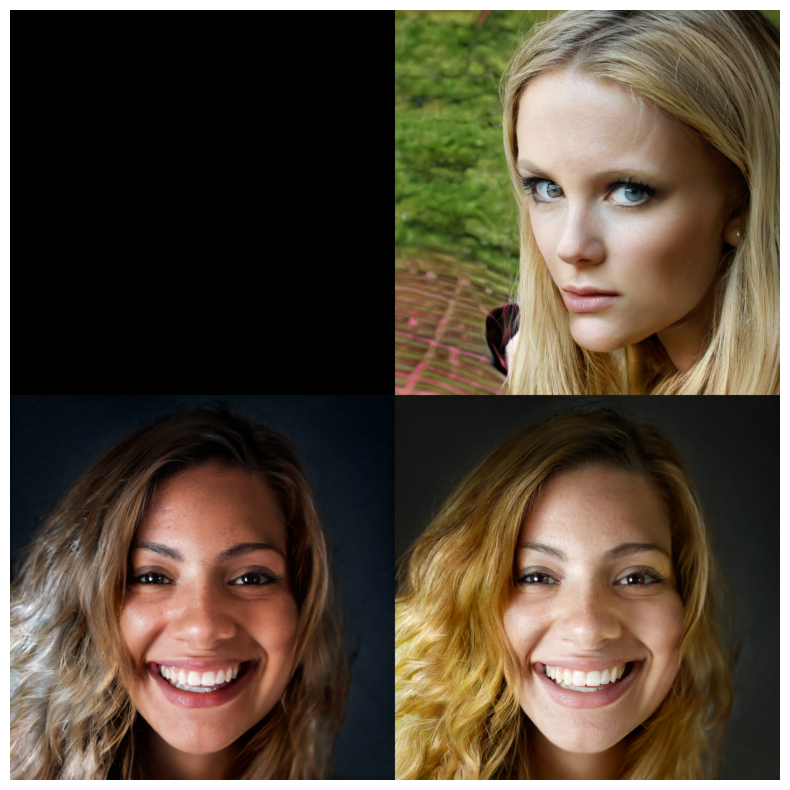

In [26]:
row_seeds = [39009]
col_seeds = [99005]
all_seeds = list(set(row_seeds + col_seeds))

all_z = np.stack([np.random.RandomState(seed).randn(G.z_dim) for seed in all_seeds])
all_w = G.mapping(torch.from_numpy(all_z).to(device), None)
w_avg = G.mapping.w_avg
truncation_psi = 1
all_w = w_avg + (all_w - w_avg) * truncation_psi
w_dict = {seed: w for seed, w in zip(all_seeds, list(all_w))}

x,img = G.synthesis.b4(None, None, all_w[:,0:2,:].to(device))
x,img = G.synthesis.b8(x, img, all_w[:,1:4,:].to(device))
x,img = G.synthesis.b16(x, img, all_w[:,3:6,:].to(device))
x,img = G.synthesis.b32(x, img, all_w[:,5:8,:].to(device))
x,img = G.synthesis.b64(x, img, all_w[:,7:10,:].to(device))
x,img = G.synthesis.b128(x, img, all_w[:,9:12,:].to(device))
x,img = G.synthesis.b256(x, img, all_w[:,11:14,:].to(device))
x,img = G.synthesis.b512(x, img, all_w[:,13:16,:].to(device))
x,img = G.synthesis.b1024(x, img, all_w[:,15:18,:].to(device))
# print(x.shape,img.shape)

print('Generating style-mixed images...')
all_images = img
all_images = (all_images.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).cpu().numpy()
image_dict = {(seed, seed): image for seed, image in zip(all_seeds, list(all_images))}

for row_seed in row_seeds:
    for col_seed in col_seeds:
        w = w_dict[row_seed].clone()
        col_styles = [10,11,12,13,14,15,16,17] # Choose the different values (0-17) to see the effect of change in depth
        w[col_styles] = w_dict[col_seed][col_styles]
        w = w[np.newaxis]
        x,img = G.synthesis.b4(None, None, w[:,0:2,:].to(device))
        x,img = G.synthesis.b8(x, img, w[:,1:4,:].to(device))
        x,img = G.synthesis.b16(x, img, w[:,3:6,:].to(device))
        x,img = G.synthesis.b32(x, img, w[:,5:8,:].to(device))
        x,img = G.synthesis.b64(x, img, w[:,7:10,:].to(device))
        x,img = G.synthesis.b128(x, img, w[:,9:12,:].to(device))
        x,img = G.synthesis.b256(x, img, w[:,11:14,:].to(device))
        x,img = G.synthesis.b512(x, img, w[:,13:16,:].to(device))
        x,img = G.synthesis.b1024(x, img, w[:,15:18,:].to(device))
        image = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
        image_dict[(row_seed, col_seed)] = image[0].cpu().numpy()

W = 1024
H = 1024
canvas = PIL.Image.new('RGB', (W * (len(col_seeds) + 1), H * (len(row_seeds) + 1)), 'black')
for row_idx, row_seed in enumerate([0] + row_seeds):
    for col_idx, col_seed in enumerate([0] + col_seeds):
        if row_idx == 0 and col_idx == 0:
            continue
        key = (row_seed, col_seed)
        if row_idx == 0:
            key = (col_seed, col_seed)
        if col_idx == 0:
            key = (row_seed, row_seed)
        canvas.paste(PIL.Image.fromarray(image_dict[key], 'RGB'), (W * col_idx, H * row_idx))
canvas.save(f'grid.png')

import matplotlib.pyplot as plt
import numpy as np

# Load an example image (replace with your own image path)
image = plt.imread('grid.png')

# Create a new figure and plot the image
fig, ax = plt.subplots(figsize=(10,10))  # Set the figure size to fill the plot with the image
ax.imshow(image)
ax.axis('off')  # Remove the x and y axis labels

# Show the plot
plt.show()

# Modify the code to perform style mixing with more than two latent vectors. Display the resulting images.

Generating style-mixed images...


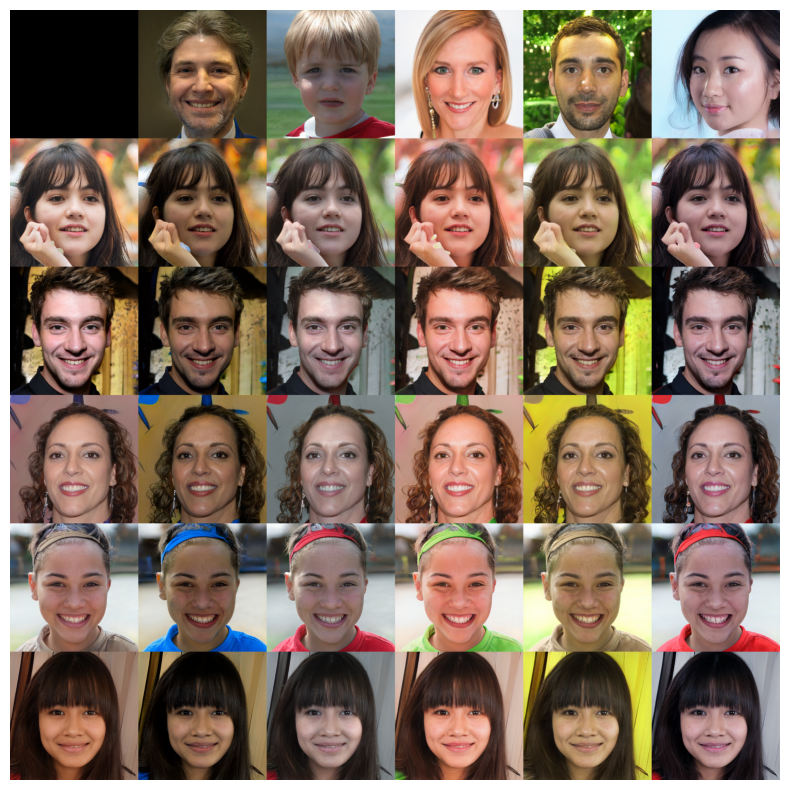

In [27]:
row_seeds = [3992, 4529, 3986, 5983, 653586]
col_seeds = [534654, 8087685, 32, 25, 35]
all_seeds = list(set(row_seeds + col_seeds))

all_z = np.stack([np.random.RandomState(seed).randn(G.z_dim) for seed in all_seeds])
all_w = G.mapping(torch.from_numpy(all_z).to(device), None)
w_avg = G.mapping.w_avg
truncation_psi = 1
all_w = w_avg + (all_w - w_avg) * truncation_psi
w_dict = {seed: w for seed, w in zip(all_seeds, list(all_w))}


# If you want images at bx(eg: b8) layer comment out rest of the bx layers afterwards
x,img = G.synthesis.b4(None, None, all_w[:,0:2,:].to(device))
x,img = G.synthesis.b8(x, img, all_w[:,1:4,:].to(device))
x,img = G.synthesis.b16(x, img, all_w[:,3:6,:].to(device))
x,img = G.synthesis.b32(x, img, all_w[:,5:8,:].to(device))
x,img = G.synthesis.b64(x, img, all_w[:,7:10,:].to(device))
x,img = G.synthesis.b128(x, img, all_w[:,9:12,:].to(device))
x,img = G.synthesis.b256(x, img, all_w[:,11:14,:].to(device))
x,img = G.synthesis.b512(x, img, all_w[:,13:16,:].to(device))
x,img = G.synthesis.b1024(x, img, all_w[:,15:18,:].to(device))
# print(x.shape,img.shape)

print('Generating style-mixed images...')
all_images = img
all_images = (all_images.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).cpu().numpy()
image_dict = {(seed, seed): image for seed, image in zip(all_seeds, list(all_images))}

for row_seed in row_seeds:
    for col_seed in col_seeds:
        w = w_dict[row_seed].clone()
        col_styles = [10,11,12,13,14,15,16,17]
        w[col_styles] = w_dict[col_seed][col_styles]
        w = w[np.newaxis]
        # If you want images at bx(eg: b8) layer comment out rest of the bx layers afterwards
        x,img = G.synthesis.b4(None, None, w[:,0:2,:].to(device))
        x,img = G.synthesis.b8(x, img, w[:,1:4,:].to(device))
        x,img = G.synthesis.b16(x, img, w[:,3:6,:].to(device))
        x,img = G.synthesis.b32(x, img, w[:,5:8,:].to(device))
        x,img = G.synthesis.b64(x, img, w[:,7:10,:].to(device))
        x,img = G.synthesis.b128(x, img, w[:,9:12,:].to(device))
        x,img = G.synthesis.b256(x, img, w[:,11:14,:].to(device))
        x,img = G.synthesis.b512(x, img, w[:,13:16,:].to(device))
        x,img = G.synthesis.b1024(x, img, w[:,15:18,:].to(device))

        image = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
        image_dict[(row_seed, col_seed)] = image[0].cpu().numpy()

#Chosse width and hight resolution according to the genrated images
W = 1024
H = 1024
canvas = PIL.Image.new('RGB', (W * (len(col_seeds) + 1), H * (len(row_seeds) + 1)), 'black')
for row_idx, row_seed in enumerate([0] + row_seeds):
    for col_idx, col_seed in enumerate([0] + col_seeds):
        if row_idx == 0 and col_idx == 0:
            continue
        key = (row_seed, col_seed)
        if row_idx == 0:
            key = (col_seed, col_seed)
        if col_idx == 0:
            key = (row_seed, row_seed)
        canvas.paste(PIL.Image.fromarray(image_dict[key], 'RGB'), (W * col_idx, H * row_idx))
canvas.save(f'grid.png')

import matplotlib.pyplot as plt
import numpy as np

# Load an example image (replace with your own image path)
image = plt.imread('grid.png')

# Create a new figure and plot the image
fig, ax = plt.subplots(figsize=(10,10))  # Set the figure size to fill the plot with the image
ax.imshow(image)
ax.axis('off')  # Remove the x and y axis labels

# Show the plot
plt.show()